In [115]:
import gymnasium as gym
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

#### O Gymnasium, *aka* gym, é uma biblioteca derivada da gym do grupo OpenAI. Ela consiste em uma API que simula diversos ambientes de controle, jogos, ambientes 3D, etc... para que usuários possam aplicar técnicas de *Reinforcement Learning*

#### O objetivo desta prática é implementar uma solução de **Aprendizado por Reforço** para o *Cart Pole* que consiste em:
* Manter o pêndulo invertido orientado para cima - o ângulo do poste não deve ultrapassar o intervalo [-.2095, .2095] radianos
* O vagão deve se manter no trilho - sua posição em X deve se manter no intervalo [-2.4, 2.4]

#### Primeiramente vamos criar um ambiente do 'CartPole-v1', iniciar com o método reset() e interagir com o ambiente com alguns passos aleatórios. 

<hr>

# *Cart Pole*
* https://gymnasium.farama.org/environments/classic_control/cart_pole/

In [116]:
env = gym.make('CartPole-v1', render_mode="rgb_array")
_ = env.reset()
frames = []
actions, rewards = [], []
done = False

while not done:
    frames.append(env.render())
    action = env.action_space.sample() 
    state, reward, done, _, _ = env.step(action)
    actions.append(action)
    rewards.append(reward)

round4 = lambda x: round(x, 4)
print("Ações aleatorias:", actions, "\nRecompensa Imediata:", rewards, sep='\n')
print('\nEstado final:', 'Cart Position    |   Cart Velocity   |   Pole Angle  |   Pole Angular Velocity', sep='\n')
print(*map(round4, state), sep=" "*16)

Ações aleatorias:
[np.int64(1), np.int64(1), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(1), np.int64(1), np.int64(0), np.int64(1), np.int64(1), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(1), np.int64(1), np.int64(0)]

Recompensa Imediata:
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

Estado final:
Cart Position    |   Cart Velocity   |   Pole Angle  |   Pole Angular Velocity
-0.1481                -1.015                0.2343                1.7574


In [117]:
def display_frames_as_gif(frames):

    plt.ioff()
    aspect = 72
    fig, ax = plt.subplots(figsize=(frames[0].shape[1] / aspect, frames[0].shape[0] / aspect), dpi=aspect)
    patch = ax.imshow(frames[0])
    _ = plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=50, )
    return anim

anim = display_frames_as_gif(frames)
HTML(anim.to_jshtml())

# Sua implementação do *CartPole*

In [118]:
env = gym.make('CartPole-v1', render_mode = 'rgb_array')

# Q-learning parameters
alpha = 0.1  
gamma = 0.99  

epsilon_zero = 1.0 #TODO  # valor inicial de epsilon
epsilon_min = 0.0 #TODO  # valor final de epsilon
episodes = 100000 #TODO  # Numero maximo de episodios do treinamento. MAXIMO PERMITIDO 250_000
min_epsilon_episode = 100000 #TODO #Episodio que o epsilon mínimo é atingido

max_steps = 500  # Número máximo de passos no treinamento. Fixo! 
epsilon = epsilon_zero
epsilon_decay = -0.00001 # (epsilon_min - epsilon) / min_epsilon_episode  # Decaimento Linear do Epsilon, PERMITIDO ALTERAÇÕES
print(f"{epsilon} {epsilon_decay}")

1.0 -1e-05


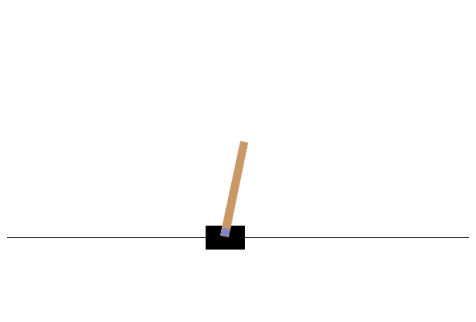

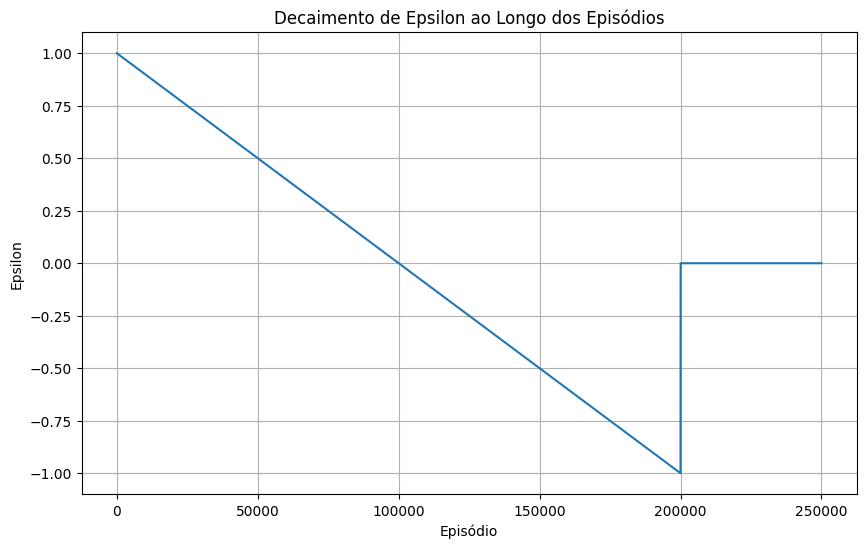

In [119]:
#TODO
# Faça um plot da variação de epsilon durante o decorrer de 'episodes'

epsilon_values = []
aux = epsilon
# Calcula o valor de epsilon para cada episódio
for episode in range(episodes):
    if episode < min_epsilon_episode:
        aux += epsilon_decay
    else:
        aux = epsilon_min
    epsilon_values.append(aux)

# Plot do decaimento de epsilon
plt.figure(figsize=(10, 6))
plt.plot(epsilon_values)
plt.title('Decaimento de Epsilon ao Longo dos Episódios')
plt.xlabel('Episódio')
plt.ylabel('Epsilon')
plt.grid(True)
plt.show()


In [121]:
# Define the bins for each state variable
n_bins = 25 #TODO Escolha um número de estados para cada variável
bins = [
    np.linspace(-4.8, 4.8, n_bins), #Cart Position
    np.linspace(-4, 4, n_bins), #Cart Velocity
    np.linspace(-0.418, 0.418, n_bins), #Pole Angle
    np.linspace(-4, 4, n_bins) #Pole Angular Velocity
]
def discretize_state(state, bins):
    """ 
        As variaveis do CartPole originalmente são contínuas. Discretize.
        Implemente a função discretize_state(state, bins) -> state_discretized
            state: list | tuple = Estado do vagão
            bins: Lista com as discretizações

            return state_discretized: tuple = Estados discretizados
    """
    state_discretized = []
    for i in range(len(state)):
        # np.digitize retorna o índice do bin ao qual o valor pertence
        discretized_value = np.digitize(state[i], bins[i]) - 1
        state_discretized.append(discretized_value)
    return tuple(state_discretized)

# Inicialização da Q-table
state_space_size = tuple([len(bins[i]) + 1 for i in range(len(bins))])
action_space_size = env.action_space.n
Q = np.zeros(state_space_size + (action_space_size,))

In [122]:
print(Q.shape)

(26, 26, 26, 26, 2)


In [123]:
def choose_action(state, Q, epsilon):
    """
        Implemente a função choose_action(state, Q, epsilon)
        Escolha de forma probabilística conforme epsilon entre uma ação aleatória ou uma ação ótima
    """
    if np.random.rand() < epsilon:
        # Escolhe uma ação aleatória (exploração)
        action = np.random.choice(range(Q.shape[-1]))
    else:
        # Escolhe a melhor ação conhecida (exploração)
        action = np.argmax(Q[state])
    return action

def update_q_table(Q, state, action, reward, next_state, alpha, gamma):
    """
        Faça a atualização da Q-table conforme formulação do RL
    """
    # Valor Q atual
    current_q = Q[state][action]

    # Melhor valor Q para o próximo estado
    best_next_q = np.max(Q[next_state])

    # Fórmula de atualização do Q-learning
    new_q = current_q + alpha * (reward + gamma * best_next_q - current_q)

    # Atualiza a tabela Q
    Q[state][action] = new_q

In [125]:
#Treinamento da Q-table
for episode in range(episodes):
    state, _ = env.reset()
    state = discretize_state(state, bins)
    total_reward = 0

    for step in range(max_steps):
        action = choose_action(state, Q, epsilon)
        next_state, reward, done, truncated, _ = env.step(action)
        next_state = discretize_state(next_state, bins)

        update_q_table(Q, state, action, reward, next_state, alpha, gamma)

        state = next_state
        total_reward += reward

        if done:
            break

    print(f"Episode {episode + 1}: Total Reward = {total_reward}, epislon = {epsilon}")
    # Decay epsilon
    if epsilon > epsilon_min:
        epsilon = epsilon_decay*episode + epsilon_zero


print("Training finished.\n")

Episode 1: Total Reward = 25.0, epislon = 1.0
Episode 2: Total Reward = 28.0, epislon = 1.0
Episode 3: Total Reward = 20.0, epislon = 0.99999
Episode 4: Total Reward = 34.0, epislon = 0.99998
Episode 5: Total Reward = 13.0, epislon = 0.99997
Episode 6: Total Reward = 13.0, epislon = 0.99996
Episode 7: Total Reward = 24.0, epislon = 0.99995
Episode 8: Total Reward = 39.0, epislon = 0.99994
Episode 9: Total Reward = 15.0, epislon = 0.99993
Episode 10: Total Reward = 21.0, epislon = 0.99992
Episode 11: Total Reward = 25.0, epislon = 0.99991
Episode 12: Total Reward = 29.0, epislon = 0.9999
Episode 13: Total Reward = 21.0, epislon = 0.99989
Episode 14: Total Reward = 23.0, epislon = 0.99988
Episode 15: Total Reward = 29.0, epislon = 0.99987
Episode 16: Total Reward = 19.0, epislon = 0.99986
Episode 17: Total Reward = 25.0, epislon = 0.99985
Episode 18: Total Reward = 24.0, epislon = 0.99984
Episode 19: Total Reward = 15.0, epislon = 0.99983
Episode 20: Total Reward = 10.0, epislon = 0.9998

KeyboardInterrupt: 

In [126]:
frames = []

state, _ = env.reset()
state = discretize_state(state, bins)
total_reward = 0

for step in range(max_steps):
    
    frames.append(env.render())

    action = np.argmax(Q[state])
    next_state, reward, done, truncated, _  = env.step(action)
    next_state = discretize_state(next_state, bins)

    state = next_state
    total_reward += reward
    
    if done:
        break

print(f"Test Episode {episode + 1}: Total Reward = {total_reward}")

Test Episode 106837: Total Reward = 500.0


In [127]:
anim = display_frames_as_gif(frames)
HTML(anim.to_jshtml())

In [ ]:
# TODO implemente uma pertubação do cartpole e avalie o resultado